Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'stringency_index',
       'population', 'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
     

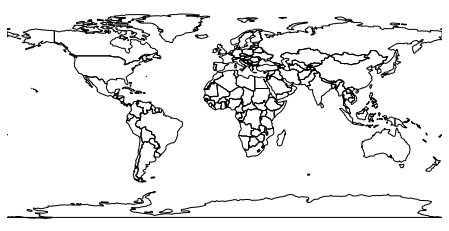

interactive(children=(SelectionSlider(description='date', layout=Layout(width='75%'), options=((datetime.date(…

In [4]:
%run final_project_pg1_gathering_data.ipynb

In [5]:
import pandas as pd
import pydataset
import numpy as np
import plotly.express as px
import matplotlib
from matplotlib import pylab as plt
import geopandas as gpd
import geoplot as gplt
import import_ipynb
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [6]:
covid_world.tail()

,name,geometry,continent,date,new_cases_smoothed_per_million,total_cases_per_million,new_deaths_smoothed_per_million,total_deaths_per_million,total_tests_per_thousand,new_tests_smoothed_per_thousand,tests_per_case
52493,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-11-27,5.709,653.572,0.096,18.502,11.137,0.070,12.2
52494,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-11-28,6.248,660.839,0.096,18.502,11.253,0.080,12.8
52495,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-11-29,5.786,660.839,0.067,18.502,11.318,0.076,13.2
52496,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-11-30,6.171,669.451,0.029,18.570,11.371,0.078,12.7
52497,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-12-01,7.026,681.494,0.029,18.637,NaN,NaN,NaN


In [7]:
female_led_countries = ['Bangladesh','Belgium','Bolivia','Denmark','Estonia','Finland','Georgia','Germany','Iceland',
                        'Myanmar','Namibia','Nepal','New Zealand','Norway','Republic of Serbia','Slovakia','Taiwan',
                        'Trinidad and Tobago']
male_led_countries = ['Afghanistan','Angola','Albania','United Arab Emirates','Argentina','Armenia','Australia',
                      'Austria','Azerbaijan','Burundi','Benin','Burkina Faso','Bulgaria','The Bahamas',
                      'Bosnia and Herzegovina','Belarus','Belize','Bermuda','Brazil','Brunei','Bhutan','Botswana',
                      'Central African Republic','Canada','Switzerland','Chile','China','Ivory Coast','Cameroon',
                      'Democratic Republic of the Congo','Republic of the Congo','Colombia','Costa Rica','Cuba',
                      'Cyprus','Czech Republic','Djibouti','Dominican Republic','Algeria','Ecuador','Egypt',
                      'Eritrea','Western Sahara','Spain','Ethiopia','Fiji','Falkland Islands','France','Gabon',
                      'United Kingdom','Ghana','Guinea','Gambia','Guinea Bissau','Equatorial Guinea','Greece',
                      'Greenland','Guatemala','Guyana','Honduras','Croatia','Haiti','Hungary','Indonesia','India',
                      'Ireland','Iran','Iraq','Israel','Italy','Jamaica','Jordan','Japan','Kazakhstan','Kenya',
                      'Kyrgyzstan','Cambodia','South Korea','Kuwait','Laos','Lebanon','Liberia','Libya','Sri Lanka',
                      'Lesotho','Lithuania','Luxembourg','Latvia','Morocco','Moldova','Madagascar','Mexico',
                      'Macedonia','Mali','Malta','Montenegro','Mongolia','Mozambique','Mauritania','Malawi','Malaysia',
                      'New Caledonia','Niger','Nigeria','Nicaragua','Netherlands','Oman','Pakistan','Panama','Peru',
                      'Philippines','Papua New Guinea','Poland','Puerto Rico','Portugal','Paraguay','West Bank',
                      'Qatar','Romania','Russia','Rwanda','Saudi Arabia','Sudan','Senegal','Sierra Leone',
                      'El Salvador','Somalia','South Sudan','Suriname','Slovenia','Sweden','Swaziland','Syria','Chad',
                      'Togo','Thailand','Tajikistan','East Timor','Tunisia','Turkey','United Republic of Tanzania',
                      'Uganda','Ukraine','Uruguay','United States of America','Uzbekistan','Venezuela','Vietnam',
                      'Yemen','South Africa','Zambia','Zimbabwe']
print('female_led_countries:', len(female_led_countries))
print('male_led_countries:', len(male_led_countries))
print('fraction male led:' , len(male_led_countries)/(len(male_led_countries) + len(female_led_countries)))

female_led_countries: 18
male_led_countries: 152
fraction male led: 0.8941176470588236


In [8]:
gender = ['F' if name in female_led_countries else 'M' for name in covid_world['name']]
covid_world = covid_world.assign(leader_gender = gender)
covid_world.tail()

,name,geometry,continent,date,new_cases_smoothed_per_million,total_cases_per_million,new_deaths_smoothed_per_million,total_deaths_per_million,total_tests_per_thousand,new_tests_smoothed_per_thousand,tests_per_case,leader_gender
52493,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-11-27,5.709,653.572,0.096,18.502,11.137,0.070,12.2,M
52494,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-11-28,6.248,660.839,0.096,18.502,11.253,0.080,12.8,M
52495,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-11-29,5.786,660.839,0.067,18.502,11.318,0.076,13.2,M
52496,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-11-30,6.171,669.451,0.029,18.570,11.371,0.078,12.7,M
52497,Zimbabwe,"POLYGON ((31.19141 -22.25151, 30.65986 -22.15157, 30.32288 -22.27161, 29.83904 -22.102...",Africa,2020-12-01,7.026,681.494,0.029,18.637,NaN,NaN,NaN,M


In [9]:
px.line(covid_world,
        x="date",
        y="new_cases_smoothed_per_million",
        line_group="name",
        color="leader_gender",
        color_discrete_sequence=["blue", "magenta"])

In [10]:
today = pd.Timestamp(2020, 12, 1)
todays_data = covid_world.query('date == @today').reset_index(drop=True)
todays_data = todays_data.drop(['date'],axis=1)
todays_data

,name,geometry,continent,new_cases_smoothed_per_million,total_cases_per_million,new_deaths_smoothed_per_million,total_deaths_per_million,total_tests_per_thousand,new_tests_smoothed_per_thousand,tests_per_case,leader_gender
0,Afghanistan,"POLYGON ((61.21082 35.65007, 62.23065 35.27066, 62.98466 35.40404, 63.19354 35.85717, ...",Asia,5.662,1200.077,0.301,46.162,NaN,NaN,NaN,M
1,Angola,"MULTIPOLYGON (((16.32653 -5.87747, 16.57318 -6.62265, 16.86019 -7.22230, 17.09000 -7.5...",Africa,2.212,464.032,0.052,10.649,NaN,NaN,NaN,M
2,Albania,"POLYGON ((20.59025 41.85540, 20.46317 41.51509, 20.60518 41.08623, 21.02004 40.84273, ...",Europe,234.008,13556.884,4.319,285.635,NaN,NaN,NaN,M
3,United Arab Emirates,"POLYGON ((51.57952 24.24550, 51.75744 24.29407, 51.79439 24.01983, 52.57708 24.17744, ...",Asia,126.876,17203.450,0.246,58.238,1704.445,12.964,102.2,M
4,Argentina,"MULTIPOLYGON (((-65.50000 -55.20000, -66.45000 -55.25000, -66.95992 -54.89681, -67.562...",South America,160.492,31696.988,4.729,861.319,NaN,NaN,NaN,M
5,Armenia,"POLYGON ((43.58275 41.09214, 44.97248 41.24813, 45.17950 40.98535, 45.56035 40.81229, ...",Asia,407.132,45884.665,9.208,740.070,NaN,NaN,NaN,M
6,Australia,"MULTIPOLYGON (((145.39798 -40.79255, 146.36412 -41.13770, 146.90858 -41.00055, 147.689...",Oceania,0.392,1095.025,0.006,35.608,393.117,1.393,3552.9,M
7,Austria,"POLYGON ((16.97967 48.12350, 16.90375 47.71487, 16.34058 47.71290, 16.53427 47.49617, ...",Europe,488.208,31698.459,11.865,369.182,346.588,3.039,6.2,M
8,Azerbaijan,"MULTIPOLYGON (((45.00199 39.74000, 45.29814 39.47175, 45.73998 39.47400, 45.73538 39.3...",Asia,375.841,12387.793,3.367,141.333,NaN,NaN,NaN,M
9,Burundi,"POLYGON ((29.34000 -4.49998, 29.27638 -3.29391, 29.02493 -2.83926, 29.63218 -2.91786, ...",Africa,0.192,57.944,0.000,0.084,NaN,NaN,NaN,M


In [11]:
y = todays_data['leader_gender']
X = todays_data.loc[:, 'new_cases_smoothed_per_million': 'tests_per_case']
print(y)
print()
print(X.head())

0      M
1      M
2      M
3      M
4      M
5      M
6      M
7      M
8      M
9      M
10     F
11     M
12     M
13     F
14     M
15     M
16     M
17     M
18     M
19     F
20     M
21     M
22     M
23     M
24     M
25     M
26     M
27     M
28     M
29     M
30     M
31     M
32     M
33     M
34     M
35     M
36     M
37     M
38     F
39     M
40     F
41     M
42     M
43     M
44     M
45     M
46     M
47     F
48     M
49     F
50     M
51     M
52     M
53     M
54     F
55     M
56     M
57     M
58     M
59     M
60     M
61     M
62     M
63     M
64     M
65     M
66     M
67     M
68     M
69     M
70     M
71     M
72     F
73     M
74     M
75     M
76     M
77     M
78     M
79     M
80     M
81     M
82     M
83     M
84     M
85     M
86     M
87     M
88     M
89     M
90     M
91     M
92     M
93     M
94     M
95     M
96     M
97     M
98     M
99     M
100    F
101    M
102    M
103    M
104    M
105    M
106    M
107    F
108    M
109    M
110    M
1

In [12]:
for i in range(len(X.columns)):
    print(X.iloc[:,i])
    print(X.iloc[:,i].describe())
    print()

0         5.662
1         2.212
2       234.008
3       126.876
4       160.492
5       407.132
6         0.392
7       488.208
8       375.841
9         0.192
10      214.589
11        1.167
12        1.189
13       13.215
14      399.411
15       30.152
16      319.868
17      170.322
18      186.466
19        8.114
20      180.171
21        0.327
22        5.184
23       45.561
24        0.207
25      155.336
26      433.806
27       73.064
28        0.069
29        0.964
30        3.326
31        0.876
32        3.676
33      174.906
34      195.800
35        5.436
36      274.657
37      346.038
38      224.192
39        1.591
40      220.271
41       68.361
42       23.300
43       58.599
44        3.575
45        0.765
46      188.216
47      251.783
48        4.925
49       81.810
50        0.637
51      151.676
52        4.108
53      220.157
54      985.703
55        2.221
56        2.785
57        1.005
58        1.379
59        1.935
60      169.035
61       27.311
62      

In [13]:
groups = np.array(todays_data['leader_gender'])
print(groups)
print(len(groups))

['M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'F' 'M' 'M' 'F' 'M' 'M' 'M' 'M'
 'M' 'F' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M'
 'M' 'M' 'F' 'M' 'F' 'M' 'M' 'M' 'M' 'M' 'M' 'F' 'M' 'F' 'M' 'M' 'M' 'M'
 'F' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M'
 'F' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M'
 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'F' 'M' 'M' 'M' 'M' 'M' 'M' 'F'
 'M' 'M' 'M' 'M' 'F' 'F' 'F' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M'
 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'F' 'M' 'F' 'M' 'M' 'M' 'M'
 'M' 'M' 'M' 'M' 'M' 'F' 'M' 'M' 'F' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M'
 'M' 'M' 'M' 'M' 'M']
167


In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

std_ftrs = ['total_cases_per_million', 'total_deaths_per_million', 'total_tests_per_thousand']

# collect all the encoders
preprocessor = ColumnTransformer(transformers=[('std', StandardScaler(), std_ftrs)])

clf = Pipeline(steps=[('preprocessor', preprocessor)])


for i in range(10):
    random_state = i
    print('random_state:', random_state)
    
    # stratified train-test split
    X_other, X_test, y_other, y_test = train_test_split(X,y,test_size = 0.2,stratify=y,random_state=random_state)
    print('test balance:')
    print(y_test.value_counts())
    print(y_test.value_counts(normalize=True))
    print('test set:')
    print(X_test)
    print(y_test)
    print()
    
    # do StratifiedKFold split on other
    skf = StratifiedKFold(n_splits=5,shuffle=True,random_state=random_state)
    for train_index, val_index in skf.split(X_other,y_other):
        X_train = X_other.iloc[train_index]
        y_train = y_other.iloc[train_index]
        X_val = X_other.iloc[val_index]
        y_val = y_other.iloc[val_index]
        print('train balance:')
        print(y_train.value_counts())
        print(y_train.value_counts(normalize=True))
        
        print('training set:')
        print(X_train)
        print(y_train)
        print()
        
        print('val balance:')
        print(y_val.value_counts())
        print(y_val.value_counts(normalize=True))
        
        print('validation set:')
        print(X_val)
        print(y_val)
        print()
        
        
        X_train_prep = clf.fit_transform(X_train)
        X_test_prep = clf.transform(X_test)
        X_val_prep = clf.transform(X_val)
        
        le = LabelEncoder()
        y_train_prep = le.fit_transform(y_train)
        y_val_prep = le.transform(y_val)
        y_test_prep = le.transform(y_test)
        
        print('training_prep set:')
        print(X_train_prep)
        print(y_train_prep)
        print()
        print('validation_prep set:')
        print(X_val_prep)
        print(y_val_prep)
        print()
        print('test_prep set:')
        print(X_test_prep)
        print(y_test_prep)
        print()
        print()
    
    
        
    print()

random_state: 0
test balance:
M    30
F     4
Name: leader_gender, dtype: int64
M    0.882353
F    0.117647
Name: leader_gender, dtype: float64
test set:
     new_cases_smoothed_per_million  total_cases_per_million  \
97                          464.972                30212.923   
47                          251.783                 9420.756   
128                           0.000                   16.741   
130                           5.258                  411.523   
143                           4.930                  455.583   
129                           7.723                10272.430   
9                             0.192                   57.944   
139                         253.549                19631.870   
44                            3.575                 1136.500   
118                          56.533                29225.085   
28                            0.069                   64.609   
90                          688.601                22964.114   
61            

53                        NaN                              NaN             NaN  
137    F
147    M
117    M
23     M
125    M
2      M
135    M
29     M
21     M
126    M
123    M
25     M
120    M
19     F
160    M
83     M
17     M
133    M
127    M
155    M
92     M
89     M
77     M
22     M
26     M
142    M
59     M
33     M
102    M
87     M
68     M
63     M
11     M
7      M
158    M
152    F
162    M
65     M
15     M
13     F
67     M
4      M
40     F
52     M
84     M
99     M
75     M
85     M
27     M
146    M
57     M
50     M
46     M
148    M
48     M
1      M
12     M
124    M
100    F
36     M
60     M
70     M
140    M
138    M
62     M
134    M
95     M
119    M
165    M
72     F
131    M
8      M
101    M
141    M
145    M
136    M
161    M
104    M
115    M
64     M
80     M
107    F
163    M
76     M
66     M
73     M
154    M
132    M
49     F
56     M
14     M
42     M
114    F
166    M
51     M
69     M
151    M
71     M
122    M
38     F
108    M
58     M
8

val balance:
M    24
F     2
Name: leader_gender, dtype: int64
M    0.923077
F    0.076923
Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
137                        1058.276                26957.809   
147                           3.894                 1282.392   
117                         343.703                38776.361   
126                         177.404                15774.629   
160                           0.051                   13.879   
127                           2.184                  459.227   
22                            5.184                  536.539   
68                           28.695                 6883.611   
11                            1.167                  248.697   
158                           5.510                 2189.356   
162                         363.961                17250.897   
84                            0.000                    5.360   
75                       

Name: leader_gender, dtype: object

val balance:
M    23
F     3
Name: leader_gender, dtype: int64
M    0.884615
F    0.115385
Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
125                         364.085                24932.006   
120                           0.623                   74.773   
19                            8.114                12405.520   
133                           0.000                   24.750   
89                            3.001                  997.548   
142                          24.011                 5552.663   
59                            1.935                 3675.021   
102                           4.924                  247.690   
63                           43.876                10929.559   
7                           488.208                31698.459   
67                           19.676                 1988.768   
52                            4.108                 4

training_prep set:
[[-0.73042061 -0.79688225         nan]
 [-0.74347556 -0.7046621   1.66697219]
 [ 0.0905764  -0.11714231         nan]
 [ 0.12481497  0.16245562         nan]
 [-0.24927742  0.12847174         nan]
 [-0.10135895  0.0093357          nan]
 [-0.68120326 -0.61157839 -0.79710485]
 [-0.56371216 -0.61803946         nan]
 [ 1.27378243  2.00782621         nan]
 [-0.803388   -0.80075264         nan]
 [-0.81778596 -0.82713445 -0.8586767 ]
 [ 2.61863767  1.8944472          nan]
 [-0.56541407 -0.52598578         nan]
 [ 3.09034989  1.00014654         nan]
 [-0.80025914 -0.80349591         nan]
 [-0.00428754  0.03297078         nan]
 [-0.78802922 -0.74452787         nan]
 [-0.05824612  0.19358178         nan]
 [-0.75550049 -0.77053859         nan]
 [-0.48694917 -0.53078215         nan]
 [-0.81840127         nan         nan]
 [-0.8165079  -0.82041675         nan]
 [ 0.70727742  0.12425801         nan]
 [-0.78238854         nan         nan]
 [-0.75836933 -0.74386546         nan]
 [-0.7

Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
6                             0.392                 1095.025   
38                          224.192                13065.486   
2                           234.008                13556.884   
59                            1.935                 3675.021   
152                           0.366                   28.509   
123                         111.922                11703.982   
30                            3.326                  922.441   
81                            0.188                   19.678   
109                           0.853                  329.088   
35                            5.436                  739.939   
86                            1.243                  315.362   
23                           45.561                 4567.905   
4                           160.492                31696.988   
97                          464.972                3

 [ 3.40542901e-01  1.49058676e-01 -4.78135863e-01]]
[1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


train balance:
M    95
F    12
Name: leader_gender, dtype: int64
M    0.88785
F    0.11215
Name: leader_gender, dtype: float64
training set:
     new_cases_smoothed_per_million  total_cases_per_million  \
6                             0.392                 1095.025   
38                          224.192                13065.486   
2                           234.008                13556.884   
150                          79.245                 8187.844   
83                           73.493                33483.173   
82                            9.552                  685.851   
59                            1.935                 3675.021   
20                          180.171                30047.068   
98                            2.434                  235.151   
152                           0.366                   28.509   
37                          346

training_prep set:
[[-7.97847210e-01 -6.94447911e-01  1.16095852e+00]
 [ 4.20613412e-02 -1.64440712e-01             nan]
 [ 7.65403293e-02  8.77872382e-02             nan]
 [-3.00178880e-01  5.71300603e-02             nan]
 [ 1.47467032e+00 -1.60432972e-01             nan]
 [-8.26556943e-01 -7.73751732e-01 -6.73174879e-01]
 [-6.16821541e-01 -6.16304801e-01             nan]
 [ 1.23357568e+00  1.75251361e+00             nan]
 [-8.58180352e-01 -7.81132106e-01             nan]
 [-8.72679408e-01 -8.04931387e-01 -9.70742073e-01]
 [ 2.58787431e+00  1.65023333e+00             nan]
 [-6.18535394e-01 -5.33262299e-01             nan]
 [-8.55029518e-01 -7.83606831e-01             nan]
 [-5.34687183e-02 -2.90222724e-02             nan]
 [-8.42713719e-01 -7.30411199e-01             nan]
 [-1.07806183e-01  1.15866448e-01             nan]
 [-8.09956583e-01 -7.53875719e-01             nan]
 [-5.39519532e-01 -5.37589157e-01             nan]
 [-8.73299036e-01             nan             nan]
 [ 6.6309275

Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
80                           61.573                11216.410   
70                          162.274                11619.439   
146                           0.205                   57.679   
22                            5.184                  536.539   
79                           15.029                 1565.315   
129                           7.723                10272.430   
61                           27.311                 6852.923   
101                         832.720                57078.760   
91                          831.844                56118.765   
127                           2.184                  459.227   
137                        1058.276                26957.809   
130                           5.258                  411.523   
136                           0.054                  280.057   
12                            1.189                 

134                       NaN                              NaN             NaN  
82     M
13     F
103    M
84     M
39     M
162    M
83     M
14     M
52     M
100    F
150    M
155    M
166    M
40     F
28     M
109    M
67     M
143    M
7      M
147    M
62     M
18     M
33     M
73     M
148    M
3      M
134    M
Name: leader_gender, dtype: object

training_prep set:
[[-0.77869901 -0.72547835         nan]
 [-0.13735075 -0.26968293         nan]
 [ 1.60844492  2.3069692          nan]
 [-0.0375948  -0.15822233         nan]
 [-0.65905053 -0.74194314         nan]
 [-0.73481286 -0.71594676 -1.18166995]
 [-0.48771977 -0.54929297         nan]
 [-0.010195    1.05707367 -0.85295588]
 [-0.79919523 -0.77633987         nan]
 [-0.7962175  -0.7747555          nan]
 [-0.71855195 -0.63120502         nan]
 [-0.05709627  0.15606328         nan]
 [-0.76366236         nan         nan]
 [ 2.5975182   3.81202156         nan]
 [-0.76859173 -0.74373665         nan]
 [-0.69372136 -0.69061898         na

training_prep set:
[[-7.31359617e-01 -7.14433746e-01 -5.12902287e-01]
 [-7.59778942e-01 -6.90598568e-01             nan]
 [-3.61410090e-02 -1.33213457e-01             nan]
 [-5.66349588e-01 -5.97133361e-01 -6.33076471e-01]
 [-7.45266630e-01 -7.37951173e-01             nan]
 [ 7.64143640e-02  3.08997060e-03             nan]
 [-7.83558454e-01             nan             nan]
 [-7.10261880e-01 -6.78942542e-01 -6.17534286e-01]
 [-4.31464938e-01 -4.75144215e-01             nan]
 [ 1.07329754e-01  1.48925652e+00 -4.71226441e-01]
 [-7.82904981e-01 -7.52796331e-01             nan]
 [-3.42979415e-01 -5.14944428e-01             nan]
 [ 5.39305421e-01 -1.86773826e-01             nan]
 [-7.79545188e-01 -7.50858827e-01             nan]
 [-6.91914571e-01 -5.75313187e-01             nan]
 [ 1.78444447e+00  4.52074390e-02             nan]
 [ 5.44107102e-02  3.87424948e-01             nan]
 [-7.42812984e-01             nan             nan]
 [-7.48374822e-01 -7.12926368e-01             nan]
 [ 8.5843729

training_prep set:
[[-0.74483423 -0.73056471 -0.52303814]
 [-0.77060846 -0.71011798         nan]
 [-0.59518231 -0.62993996 -0.63846431]
 [-0.75744686 -0.75073886         nan]
 [ 1.67213556  2.47103158         nan]
 [-0.01224284 -0.11504546         nan]
 [-0.79217472         nan         nan]
 [-0.64817319 -0.72739017         nan]
 [ 0.01579514  1.15984497 -0.48300888]
 [-0.79158207 -0.7634736          nan]
 [-0.39260205 -0.55943515         nan]
 [ 0.40756518 -0.27791788         nan]
 [-0.78853498 -0.76181154         nan]
 [ 1.5368144  -0.07891549         nan]
 [-0.03219853  0.21465176         nan]
 [-0.75522158         nan         nan]
 [ 2.68424581  4.04988714         nan]
 [-0.76026576 -0.72927162         nan]
 [ 0.69699424  1.2388662  -0.29977637]
 [-0.68365155 -0.67354923         nan]
 [-0.50455158 -0.67506171         nan]
 [-0.79232109         nan         nan]
 [-0.67467511 -0.64419383         nan]
 [-0.7312395  -0.68388062         nan]
 [-0.22293454  0.15224454         nan]
 [-0.0

124                       NaN                              NaN             NaN  
73     M
104    M
87     M
75     M
130    M
36     M
31     M
145    M
88     M
138    M
118    M
38     F
139    F
133    M
70     M
68     M
29     M
90     M
160    M
2      M
62     M
107    F
120    M
42     M
72     F
24     M
57     M
108    M
0      M
23     M
99     M
7      M
78     M
124    M
Name: leader_gender, dtype: object

train balance:
M    95
F    11
Name: leader_gender, dtype: int64
M    0.896226
F    0.103774
Name: leader_gender, dtype: float64
training set:
     new_cases_smoothed_per_million  total_cases_per_million  \
44                            3.575                 1136.500   
37                          346.038                49348.668   
102                           4.924                  247.690   
6                             0.392                 1095.025   
155                         323.872                17494.883   
63                           43.876               

training_prep set:
[[ 2.77599682  1.79624646         nan]
 [-0.22701609  0.12154573         nan]
 [-0.74449424 -0.66852746  0.43240507]
 [ 0.4520072   0.18912496 -0.38751702]
 [-0.81901095 -0.71737999         nan]
 [-0.02698595  0.18329055         nan]
 [ 0.08069727  1.73966513         nan]
 [-0.61740265 -0.65233646 -0.63568462]
 [-0.75708563 -0.73099911         nan]
 [ 1.10319839  0.74370682 -0.22949823]
 [-0.82376344 -0.78447905         nan]
 [-0.24569969 -0.24219419         nan]
 [-0.73389183 -0.71210468         nan]
 [-0.79083375 -0.77089612         nan]
 [ 0.55937619 -0.28788286         nan]
 [ 1.71892577  1.87578394         nan]
 [-0.07212968  0.00856725         nan]
 [-0.23982555 -0.61304789         nan]
 [ 0.84522855  0.90877406 -0.19767132]
 [ 1.37989043  2.04323559         nan]
 [ 1.50979973  0.70526349 -0.1587891 ]
 [ 1.1315226   2.28014441  0.35533056]
 [-0.18928409  1.93774911         nan]
 [-0.77040061 -0.74614754         nan]
 [-0.81683432 -0.76521299         nan]
 [-0.8

training_prep set:
[[-7.56916547e-01 -5.99081983e-01             nan]
 [ 2.75850396e+00  1.95079172e+00             nan]
 [-2.42763370e-01  1.47200140e-01             nan]
 [-8.21724686e-01             nan             nan]
 [-8.34414120e-01 -7.56292253e-01             nan]
 [-4.28494989e-02  2.13697056e-01             nan]
 [-9.20234339e-02  3.17845096e-01  2.22896476e-01]
 [ 6.47711244e-02  1.88985570e+00             nan]
 [-3.93690902e-02  1.88061824e+00             nan]
 [-6.32923011e-01 -6.86242743e-01 -5.99631865e-01]
 [-7.72524793e-01 -7.70959544e-01             nan]
 [ 1.08667789e+00  8.17244935e-01 -1.93467952e-01]
 [-8.39163844e-01 -8.28555493e-01             nan]
 [-2.61436115e-01 -2.44534485e-01             nan]
 [-7.49344477e-01 -7.50610935e-01             nan]
 [-8.06253302e-01 -8.13927163e-01             nan]
 [ 5.43171800e-01 -2.93739510e-01             nan]
 [ 1.70204737e+00  2.03645068e+00             nan]
 [-8.79669917e-02  2.55264405e-02             nan]
 [-2.5556538

32                        NaN                              NaN             NaN  
37     M
30     M
151    M
74     M
96     M
144    M
41     M
101    M
105    M
45     M
17     M
114    F
18     M
156    M
76     M
93     M
82     M
81     M
54     F
61     M
117    M
14     M
95     M
83     M
56     M
32     M
Name: leader_gender, dtype: object

training_prep set:
[[-7.64678490e-01 -5.89357838e-01             nan]
 [-2.37970347e-01  9.23986111e-02             nan]
 [-8.31069162e-01             nan             nan]
 [-7.67776512e-01 -6.84911879e-01  4.39242362e-01]
 [ 4.57229494e-01  1.58886181e-01 -3.75361128e-01]
 [-8.44068456e-01 -7.32975260e-01             nan]
 [-3.31748335e-02  1.53146014e-01             nan]
 [-8.35495334e-02  2.48289118e-01  1.95319120e-01]
 [ 7.70737485e-02  1.68437921e+00             nan]
 [-2.96094376e-02  1.67594045e+00             nan]
 [-6.37657190e-01 -6.68982430e-01 -6.21918938e-01]
 [ 1.12393418e+00  7.04509428e-01 -2.18367363e-01]
 [-8.48934162e-01 

 [-0.83961686 -0.82863228         nan]]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1
 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1
 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1]

validation_prep set:
[[-0.08263525  0.09389549         nan]
 [ 0.01974668  1.58420726         nan]
 [-0.64398549 -0.70626199 -1.04851037]
 [ 0.99190965  0.63052399 -0.12099359]
 [-0.75473986 -0.76349326         nan]
 [-0.80887851 -0.81978919         nan]
 [ 1.57732451  1.71454828         nan]
 [ 1.37849383  0.59371245  0.04046899]
 [-0.75797504 -0.78139043 -0.99123184]
 [ 1.8111586   0.96366707         nan]
 [-0.73219804 -0.74757696         nan]
 [ 0.84233791  0.04797632         nan]
 [-0.82446657 -0.80902192         nan]
 [-0.72324764 -0.71976596         nan]
 [-0.83105179 -0.82365962         nan]
 [-0.77158193 -0.76922174         nan]
 [-0.81890263 -0.78222183         nan]
 [ 1.06793662  0.23622255         nan]
 [-0.75182336 -0.8

141                       NaN                              NaN             NaN  
136    M
49     F
55     M
48     M
2      M
80     M
117    M
39     M
38     F
132    M
78     M
19     F
106    M
140    M
93     M
62     M
89     M
45     M
97     M
164    M
138    M
120    M
159    M
51     M
1      M
74     M
141    M
Name: leader_gender, dtype: object

training_prep set:
[[-0.10628038  0.17166078         nan]
 [ 1.29099023  0.41460241  0.75645397]
 [-0.7275984  -0.67005059         nan]
 [ 1.10414541  1.84147888  0.38353174]
 [-0.83192958 -0.77593928         nan]
 [ 1.50841766  0.27598898         nan]
 [ 0.47918555 -0.27018011 -0.06042595]
 [ 1.29089127  2.01789272         nan]
 [ 0.69801799  0.89029849 -0.22320205]
 [ 0.14890172  0.4244801          nan]
 [-0.05417948  0.0207882          nan]
 [ 0.33541534  0.17744014 -0.59668282]
 [-0.82492517         nan         nan]
 [ 1.94729817  1.87560448         nan]
 [ 2.24539652  1.62288615         nan]
 [-0.76791895 -0.6721193   1.0163383

training_prep set:
[[-1.48424901e-01  1.19501683e-01             nan]
 [ 1.26089781e+00  3.63796932e-01  6.46880631e-01]
 [-8.71071987e-01 -8.22338205e-01             nan]
 [-7.75102070e-01 -7.26899522e-01             nan]
 [ 1.07244137e+00  1.79862366e+00  2.73679085e-01]
 [-8.80333160e-01 -8.33378207e-01             nan]
 [ 4.42090945e-01 -3.24801047e-01 -1.70611132e-01]
 [-5.78241967e-01 -6.09721536e-01             nan]
 [-7.77245074e-01 -8.11576661e-01             nan]
 [ 1.26079800e+00  1.97602043e+00             nan]
 [-8.24821293e-01 -7.96929822e-01 -1.21059177e+00]
 [ 6.62810918e-01  8.42143489e-01 -3.33509161e-01]
 [ 1.08958267e-01  3.73729658e-01             nan]
 [ 2.97080650e-01  1.25313245e-01 -7.07269669e-01]
 [ 2.98584359e-02  9.00998986e-02             nan]
 [-8.73268327e-01             nan             nan]
 [ 1.92286671e+00  1.83293940e+00             nan]
 [ 2.22353629e+00  1.57881298e+00             nan]
 [-8.15770411e-01 -7.28979760e-01  9.06959633e-01]
 [ 2.3838027

Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
66                          579.571                22884.575   
155                         323.872                17494.883   
102                           4.924                  247.690   
157                         487.757                41453.759   
65                            0.839                  815.257   
69                           54.044                14743.015   
16                          319.868                27153.314   
84                            0.000                    5.360   
94                          326.868                26986.613   
61                           27.311                 6852.923   
12                            1.189                  140.217   
36                          274.657                12424.949   
29                            0.964                  808.772   
158                           5.510                 

Name: leader_gender, dtype: int64
M    0.884615
F    0.115385
Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
139                         253.549                19631.870   
5                           407.132                45884.665   
21                            0.327                  345.156   
114                           0.622                  427.188   
15                           30.152                19181.280   
50                            0.637                   46.852   
110                           1.164                  881.267   
115                          37.179                24264.181   
111                         288.684                31288.764   
122                         444.695                29466.572   
10                          214.589                49976.807   
160                           0.051                   13.879   
37                          346.038                493

Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
3                           126.876                17203.450   
52                            4.108                 4139.769   
101                         832.720                57078.760   
115                          37.179                24264.181   
86                            1.243                  315.362   
126                         177.404                15774.629   
9                             0.192                   57.944   
64                          811.779                31993.526   
123                         111.922                11703.982   
107                          26.874                 5673.545   
39                            1.591                 5748.976   
79                           15.029                 1565.315   
29                            0.964                  808.772   
133                           0.000                 

training_prep set:
[[ 0.64809317 -0.19940248         nan]
 [ 0.51258782 -0.54843169  3.66972033]
 [-0.78825529 -0.74631912         nan]
 [-0.49144588 -0.66569317         nan]
 [-0.7746009  -0.67635433         nan]
 [-0.79711105         nan         nan]
 [-0.78636677 -0.73196929         nan]
 [-0.52716496 -0.53963361         nan]
 [ 3.57727953  2.24142908         nan]
 [-0.80832893 -0.76047027         nan]
 [-0.45642497 -0.4967978          nan]
 [ 1.05525354  0.28298492         nan]
 [ 0.21275708  0.03945769         nan]
 [-0.71428639 -0.68293321         nan]
 [-0.11275569 -0.01910371         nan]
 [-0.79050151 -0.75344905         nan]
 [-0.78537785 -0.70522643         nan]
 [-0.75274619 -0.72173548         nan]
 [ 2.98316882  2.17610138         nan]
 [-0.18032349  0.26726683         nan]
 [ 3.50349731  1.20945601         nan]
 [-0.74188416 -0.67563834         nan]
 [ 2.37639078  2.29831108         nan]
 [ 0.4027731   0.26202622  0.63970297]
 [ 0.51623445 -0.21783084         nan]
 [-0.7

training_prep set:
[[-0.05802065 -0.10228692         nan]
 [-0.76912549 -0.74327857         nan]
 [ 0.49675516 -0.25386437         nan]
 [ 0.37054845 -0.57402665  3.51303228]
 [-0.56458644 -0.68158987         nan]
 [-0.79208553 -0.72316613 -0.63865672]
 [-0.82831079 -0.69136928         nan]
 [-0.84319236         nan         nan]
 [-0.83926926 -0.74238453         nan]
 [-0.5978544  -0.56595623         nan]
 [ 3.22493488  1.98509494         nan]
 [-0.53196873 -0.52666321         nan]
 [-0.71856112 -0.55955009 -0.63902026]
 [ 0.87597536  0.18862653         nan]
 [ 0.0912927  -0.03475946         nan]
 [-0.51899048 -0.47944075         nan]
 [-0.21188272 -0.08847745         nan]
 [-0.83834821 -0.71785347         nan]
 [-0.59960288 -0.47468515         nan]
 [-0.8079558  -0.73299712         nan]
 [ 1.20933891  2.00125297  0.01361312]
 [ 2.67159323  1.92517025         nan]
 [-0.71236727 -0.7357205          nan]
 [-0.27481389  0.17420843         nan]
 [ 3.15621574  1.03847258         nan]
 [ 2.1

159                       NaN                              NaN             NaN  
41     M
37     M
24     M
62     M
142    M
147    M
127    M
26     M
69     M
91     M
14     M
108    M
117    M
20     M
149    F
92     M
164    M
136    M
77     M
47     F
85     M
103    M
96     M
165    M
86     M
61     M
129    M
98     M
113    F
49     F
134    M
72     F
93     M
0      M
112    F
109    M
125    M
5      M
123    M
39     M
7      M
152    F
104    M
144    M
18     M
145    M
124    M
21     M
25     M
102    M
32     M
59     M
30     M
53     M
162    M
138    M
135    M
57     M
2      M
101    M
166    M
43     M
73     M
13     F
56     M
88     M
8      M
90     M
16     M
66     M
19     F
27     M
97     M
33     M
115    M
6      M
126    M
114    F
83     M
116    M
35     M
156    M
119    M
23     M
68     M
161    M
36     M
55     M
131    M
139    F
44     M
81     M
48     M
42     M
110    M
22     M
146    M
160    M
157    M
163    M
105    M
64     M
6

Name: leader_gender, dtype: object

val balance:
M    24
F     3
Name: leader_gender, dtype: int64
M    0.888889
F    0.111111
Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
142                          24.011                 5552.663   
127                           2.184                  459.227   
26                          433.806                38230.919   
69                           54.044                14743.015   
14                          399.411                21411.265   
92                          302.498                 9377.044   
96                           68.929                 8705.018   
165                           1.546                  960.892   
86                            1.243                  315.362   
49                           81.810                 4595.433   
134                           0.125                  302.495   
123                         111.922                11

training_prep set:
[[ 1.54044682  2.43250796         nan]
 [-0.10350929 -0.14280296         nan]
 [ 2.48561832  1.80899466         nan]
 [ 1.13565148  0.69616729         nan]
 [-0.79594897 -0.74654388         nan]
 [-0.39695503 -0.15423009         nan]
 [-0.81851969 -0.75575973 -0.56303842]
 [-0.48806988 -0.44161968         nan]
 [-0.77801538 -0.75987443         nan]
 [-0.83390715 -0.77720049 -0.59526748]
 [ 1.73073853  1.09977129         nan]
 [ 0.13594231  0.59733191  0.48050568]
 [ 2.94529855  0.9553863          nan]
 [ 0.58870727  1.20547221 -0.31459521]
 [-0.86063938 -0.77946804         nan]
 [ 1.17506636  1.91721471         nan]
 [-0.54075419 -0.50588237         nan]
 [-0.2283997  -0.421172    0.28274268]
 [ 0.04196295  0.41832789         nan]
 [-0.7840369  -0.73452421 -0.66444474]
 [ 0.42271362 -0.28872393         nan]
 [-0.83082964 -0.77584989         nan]
 [ 0.96530994  0.01393935  0.06649182]
 [-0.27402934  1.95141996         nan]
 [-0.79984479 -0.72544077 -0.67487152]
 [-0.8

39                        NaN                              NaN             NaN  
43     M
26     M
157    M
140    M
84     M
102    M
6      M
92     M
78     M
96     M
100    F
103    M
153    M
73     M
51     M
64     M
4      M
49     F
1      M
139    F
0      M
22     M
81     M
37     M
143    M
40     F
119    M
132    M
11     M
126    M
159    M
80     M
63     M
39     M
Name: leader_gender, dtype: object

train balance:
M    95
F    11
Name: leader_gender, dtype: int64
M    0.896226
F    0.103774
Name: leader_gender, dtype: float64
training set:
     new_cases_smoothed_per_million  total_cases_per_million  \
69                           54.044                14743.015   
146                           0.205                   57.679   
88                           23.784                 1145.646   
29                            0.964                  808.772   
118                          56.533                29225.085   
110                           1.164               

 [-8.17769423e-01 -6.81103946e-01             nan]]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 0 1 1
 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1]

validation_prep set:
[[-0.4959298  -0.49174838         nan]
 [-0.69510241 -0.73880164         nan]
 [-0.8432797  -0.765708           nan]
 [-0.7202537  -0.70154642 -0.21209839]
 [ 0.84499384 -0.14401419         nan]
 [-0.83777234 -0.76519421         nan]
 [-0.84643268         nan         nan]
 [ 0.56609207  0.59800414         nan]
 [-0.83077302 -0.74978694         nan]
 [ 0.23735856  0.45784376         nan]
 [ 1.28420052  1.8996364   0.23473893]
 [-0.76010029 -0.72070274 -0.50307553]
 [-0.78010033 -0.72090826         nan]
 [-0.78800282 -0.70824235         nan]
 [-0.5771574  -0.57514916         nan]
 [ 0.04694619 -0.199007           nan]
 [-0.79355588 -0.73617631         nan]
 [ 1.45875579  1.06532032         nan]
 [ 1.139

Name: leader_gender, dtype: int64
M    0.88785
F    0.11215
Name: leader_gender, dtype: float64
training set:
     new_cases_smoothed_per_million  total_cases_per_million  \
69                           54.044                14743.015   
118                          56.533                29225.085   
147                           3.894                 1282.392   
110                           1.164                  881.267   
160                           0.051                   13.879   
149                          20.109                 4776.737   
61                           27.311                 6852.923   
58                            1.379                 1240.347   
164                          48.287                13358.902   
76                          428.734                21916.488   
106                          36.732                 2075.295   
24                            0.207                 1018.269   
13                           13.215                 2837.0

validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
146                           0.205                   57.679   
88                           23.784                 1145.646   
29                            0.964                  808.772   
150                          79.245                 8187.844   
94                          326.868                26986.613   
155                         323.872                17494.883   
79                           15.029                 1565.315   
9                             0.192                   57.944   
33                          174.906                26036.103   
165                           1.546                  960.892   
135                          27.443                 6032.807   
3                           126.876                17203.450   
55                            2.221                 1662.765   
115                          37.179                24264.181   
54                      

     new_cases_smoothed_per_million  total_cases_per_million  \
146                           0.205                   57.679   
88                           23.784                 1145.646   
29                            0.964                  808.772   
147                           3.894                 1282.392   
160                           0.051                   13.879   
149                          20.109                 4776.737   
58                            1.379                 1240.347   
76                          428.734                21916.488   
106                          36.732                 2075.295   
150                          79.245                 8187.844   
24                            0.207                 1018.269   
13                           13.215                 2837.007   
145                           2.157                  362.012   
108                           1.062                   65.519   
94                          326.868     

Name: leader_gender, dtype: object

val balance:
M    24
F     3
Name: leader_gender, dtype: int64
M    0.888889
F    0.111111
Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
132                           1.698                  961.961   
83                           73.493                33483.173   
126                         177.404                15774.629   
156                          47.458                 1734.160   
89                            3.001                  997.548   
64                          811.779                31993.526   
42                           23.300                 1919.042   
46                          188.216                35428.333   
25                          155.336                10255.164   
114                           0.622                  427.188   
66                          579.571                22884.575   
65                            0.839                  

training_prep set:
[[-0.81813212 -0.78621291 -1.05159808]
 [-0.78257483 -0.73414435         nan]
 [ 0.09023022 -0.10312379         nan]
 [ 1.91235695  0.27618948         nan]
 [-0.8494282  -0.79303145         nan]
 [-0.12406545 -0.24987599         nan]
 [ 1.51758031 -0.13147456         nan]
 [-0.78259725 -0.75038082 -1.24534689]
 [ 1.28628258  1.98245094         nan]
 [ 0.26509321  0.08883317  1.68126887]
 [-0.84329228 -0.77836625         nan]
 [-0.85000959 -0.79730557         nan]
 [ 2.39471107  1.5942532          nan]
 [-0.72795886 -0.72584829 -0.61040958]
 [-0.83095536 -0.78082662         nan]
 [-0.84922047         nan         nan]
 [ 0.19068278  0.40494965         nan]
 [ 2.68413944  3.88422251         nan]
 [-0.78005784 -0.73203962         nan]
 [-0.18739417 -0.43848996  0.57961957]
 [ 0.02554961 -0.34150437         nan]
 [ 1.41222079  0.66717089 -0.27530646]
 [-0.37323045 -0.59925751         nan]
 [ 0.53790754 -0.28443425 -0.18747245]
 [-0.51276396 -0.52122417         nan]
 [-0.3

training_prep set:
[[-8.43525400e-01 -7.79715814e-01 -6.43817093e-01]
 [-8.04083564e-01 -7.19984821e-01             nan]
 [ 1.64073234e-01  3.89694927e-03             nan]
 [ 3.20454615e-02  1.35350213e+00 -5.68145736e-01]
 [-8.78240497e-01 -7.87537773e-01             nan]
 [-8.43148425e-01 -7.54250865e-01             nan]
 [-7.36336986e-02 -1.64451357e-01             nan]
 [ 1.74735772e+00 -2.86259363e-02             nan]
 [-8.04108435e-01 -7.38610654e-01 -7.46606584e-01]
 [ 3.58039563e-01  2.24102365e-01  8.06049850e-01]
 [-8.71434240e-01 -7.70714440e-01             nan]
 [-8.78885395e-01 -7.92440870e-01             nan]
 [ 2.72031280e+00  1.95106054e+00             nan]
 [ 3.86782555e-02  1.27156794e-01             nan]
 [-7.43500939e-01 -7.10467918e-01 -4.09753514e-01]
 [-8.54832210e-01 -7.57878118e-01             nan]
 [ 2.75499983e-01  5.86738659e-01             nan]
 [-8.01291598e-01 -7.17570361e-01             nan]
 [-1.43880921e-01 -3.80821824e-01  2.21592232e-01]
 [ 9.2326428

Name: leader_gender, dtype: float64
validation set:
     new_cases_smoothed_per_million  total_cases_per_million  \
127                           2.184                  459.227   
128                           0.000                   16.741   
129                           7.723                10272.430   
153                           0.000                    8.521   
18                          186.466                14722.562   
92                          302.498                 9377.044   
8                           375.841                12387.793   
139                         253.549                19631.870   
63                           43.876                10929.559   
31                            0.876                  143.577   
113                          45.961                 8012.271   
77                           17.157                 1193.708   
143                           4.930                  455.583   
7                           488.208                3

train balance:
M    95
F    11
Name: leader_gender, dtype: int64
M    0.896226
F    0.103774
Name: leader_gender, dtype: float64
training set:
     new_cases_smoothed_per_million  total_cases_per_million  \
31                            0.876                  143.577   
87                           88.089                12139.938   
34                          195.800                27516.463   
76                          428.734                21916.488   
135                          27.443                 6032.807   
68                           28.695                 6883.611   
99                          271.130                22591.436   
149                          20.109                 4776.737   
28                            0.069                   64.609   
75                           18.719                 3650.595   
139                         253.549                19631.870   
24                            0.207                 1018.269   
130                      

80                        NaN                              NaN             NaN  
87     M
67     M
34     M
76     M
63     M
135    M
99     M
54     F
137    F
149    F
75     M
139    F
24     M
127    M
106    M
96     M
97     M
112    F
156    M
39     M
8      M
121    M
108    M
33     M
143    M
65     M
103    M
158    M
132    M
151    M
58     M
18     M
23     M
98     M
78     M
128    M
90     M
111    M
77     M
46     M
2      M
89     M
43     M
17     M
124    M
166    M
79     M
35     M
162    M
117    M
61     M
164    M
50     M
32     M
104    M
116    M
47     F
94     M
115    M
86     M
69     M
142    M
62     M
41     M
56     M
134    M
113    F
44     M
146    M
119    M
129    M
52     M
36     M
15     M
163    M
7      M
160    M
85     M
59     M
131    M
100    F
102    M
49     F
26     M
16     M
20     M
48     M
3      M
120    M
125    M
19     F
148    M
51     M
6      M
14     M
126    M
29     M
38     F
82     M
93     M
0      M
150    M
4

11                        NaN                              NaN             NaN  
31     M
87     M
67     M
34     M
76     M
63     M
135    M
68     M
99     M
54     F
137    F
149    F
28     M
139    F
130    M
106    M
96     M
97     M
156    M
39     M
121    M
108    M
143    M
65     M
109    M
103    M
158    M
132    M
40     F
147    M
84     M
91     M
23     M
140    M
98     M
78     M
128    M
90     M
111    M
141    M
46     M
2      M
89     M
43     M
17     M
124    M
136    M
79     M
35     M
162    M
117    M
61     M
30     M
164    M
161    M
104    M
116    M
94     M
115    M
69     M
62     M
56     M
134    M
113    F
44     M
53     M
146    M
129    M
36     M
92     M
15     M
163    M
105    M
165    M
7      M
114    F
85     M
59     M
131    M
100    F
102    M
49     F
26     M
16     M
20     M
3      M
120    M
55     M
125    M
19     F
148    M
14     M
159    M
126    M
29     M
38     F
10     F
93     M
150    M
74     M
9      M
42     M
9

Name: leader_gender, dtype: float64
training set:
     new_cases_smoothed_per_million  total_cases_per_million  \
31                            0.876                  143.577   
87                           88.089                12139.938   
67                           19.676                 1988.768   
76                          428.734                21916.488   
63                           43.876                10929.559   
135                          27.443                 6032.807   
68                           28.695                 6883.611   
54                          985.703                34930.280   
137                        1058.276                26957.809   
149                          20.109                 4776.737   
28                            0.069                   64.609   
75                           18.719                 3650.595   
24                            0.207                 1018.269   
130                           5.258                  4

In [15]:
female = 'F'
male = 'M'
female_data = todays_data.query('leader_gender == @female')
male_data = todays_data.query('leader_gender == @male')

In [16]:
# Use these below only when you have to drop a PAIR
total_cases_per_million, total_deaths_per_million = todays_data[
    ['total_cases_per_million', 'total_deaths_per_million']].dropna().values.T.tolist()
female_total_cases_per_million, female_total_deaths_per_million = female_data[
    ['total_cases_per_million', 'total_deaths_per_million']].dropna().values.T.tolist()
male_total_cases_per_million, male_total_deaths_per_million = male_data[
    ['total_cases_per_million', 'total_deaths_per_million']].dropna().values.T.tolist()

Make histograms:

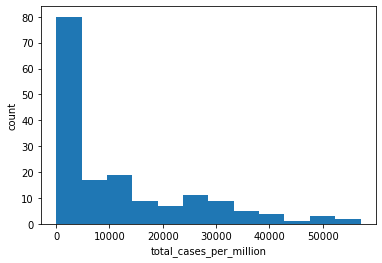

In [17]:
todays_data['total_cases_per_million'].plot.hist(bins = int(np.sqrt(todays_data.shape[0])))
plt.xlabel('total_cases_per_million')
plt.ylabel('count')
plt.show()

/Applications/anaconda3/envs/data1030/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

/Applications/anaconda3/envs/data1030/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



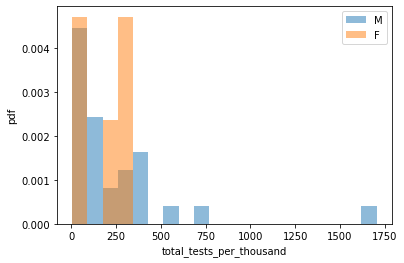

In [18]:
categories = todays_data['leader_gender'].unique()
bin_range = (todays_data['total_tests_per_thousand'].min(),todays_data['total_tests_per_thousand'].max())

for c in categories:
    plt.hist(todays_data[todays_data['leader_gender']==c]['total_tests_per_thousand'],alpha=0.5,label=c,range=bin_range,bins=20,density=True) # density=False
# When density is set equal to True, the histograms are normalized to be on the same plot.
    plt.legend()
plt.ylabel('pdf')
plt.xlabel('total_tests_per_thousand')
plt.show()

In [19]:
(todays_data['total_tests_per_thousand'].min() - todays_data['total_tests_per_thousand'].max())/-20

85.03315

Make violin plots:

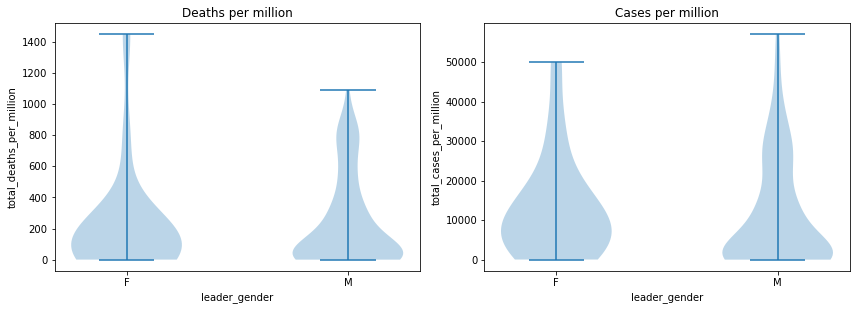

In [20]:
plt.figure(figsize=(12,8))


plt.subplot(2,2,1)
dataset = [female_data['total_deaths_per_million'].dropna().values,
           male_data['total_deaths_per_million'].dropna().values]

plt.violinplot(dataset = dataset)
plt.xticks([1,2],['F','M'])
plt.xlabel('leader_gender')
plt.ylabel('total_deaths_per_million')
plt.title('Deaths per million')

plt.subplot(2,2,2)
dataset = [female_data['total_cases_per_million'].dropna().values,
           male_data['total_cases_per_million'].dropna().values]

plt.violinplot(dataset = dataset)
plt.xticks([1,2],['F','M'])
plt.xlabel('leader_gender')
plt.ylabel('total_cases_per_million')
plt.title('Cases per million')


plt.tight_layout()
plt.show()

Make heat maps:

In [21]:
nbins = 25

heatmap, xedges, yedges = np.histogram2d(total_cases_per_million, total_deaths_per_million, bins=nbins, density=True)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

/Applications/anaconda3/envs/data1030/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning:

divide by zero encountered in log10



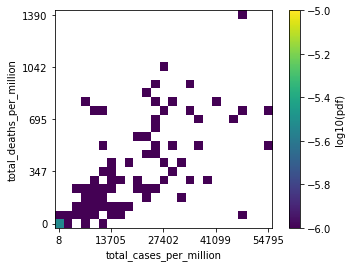

In [22]:
plt.imshow(np.log10(heatmap).T, origin='lower',vmin = -6, vmax = -5)
plt.xlabel('total_cases_per_million')
plt.ylabel('total_deaths_per_million')
plt.xticks(np.arange(nbins)[::int(nbins/4)],xedges[::int(nbins/4)].astype(int))
plt.yticks(np.arange(nbins)[::int(nbins/4)],yedges[::int(nbins/4)].astype(int))
plt.colorbar(label='log10(pdf)')
plt.show()

As we would expect, a positive correlation overall between per capita cases and per capita deaths

In [23]:
heatmap_female, xedges, yedges = np.histogram2d(female_total_cases_per_million, female_total_deaths_per_million, 
                                                bins=nbins, density=True)
heatmap_male, xedges, yedges = np.histogram2d(male_total_cases_per_million, male_total_deaths_per_million,
                                              bins=nbins, density=True)

/Applications/anaconda3/envs/data1030/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning:

divide by zero encountered in log10



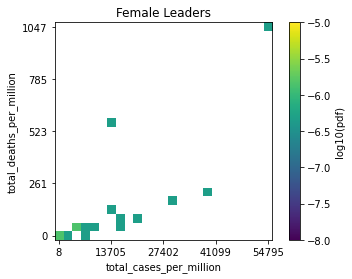

In [24]:
plt.imshow(np.log10(heatmap_female).T, origin='lower',vmin=-8, vmax=-5)
plt.xlabel('total_cases_per_million')
plt.ylabel('total_deaths_per_million')
plt.xticks(np.arange(nbins)[::int(nbins/4)],xedges[::int(nbins/4)].astype(int))
plt.yticks(np.arange(nbins)[::int(nbins/4)],yedges[::int(nbins/4)].astype(int))
plt.title('Female Leaders')
plt.colorbar(label='log10(pdf)')
plt.show()

In [25]:
(xedges[-1]-xedges[0])/25

2282.80956

/Applications/anaconda3/envs/data1030/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning:

divide by zero encountered in log10



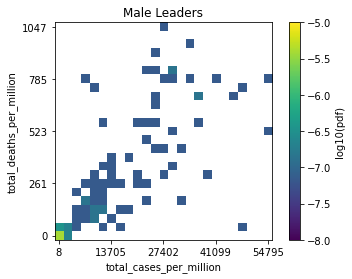

In [26]:
plt.imshow(np.log10(heatmap_male).T, origin='lower',vmin=-8, vmax=-5)
plt.xlabel('total_cases_per_million')
plt.ylabel('total_deaths_per_million')
plt.xticks(np.arange(nbins)[::int(nbins/4)],xedges[::int(nbins/4)].astype(int))
plt.yticks(np.arange(nbins)[::int(nbins/4)],yedges[::int(nbins/4)].astype(int))
plt.title('Male Leaders')
plt.colorbar(label='log10(pdf)')
plt.show()

Make a whole scatter matrix of plots:

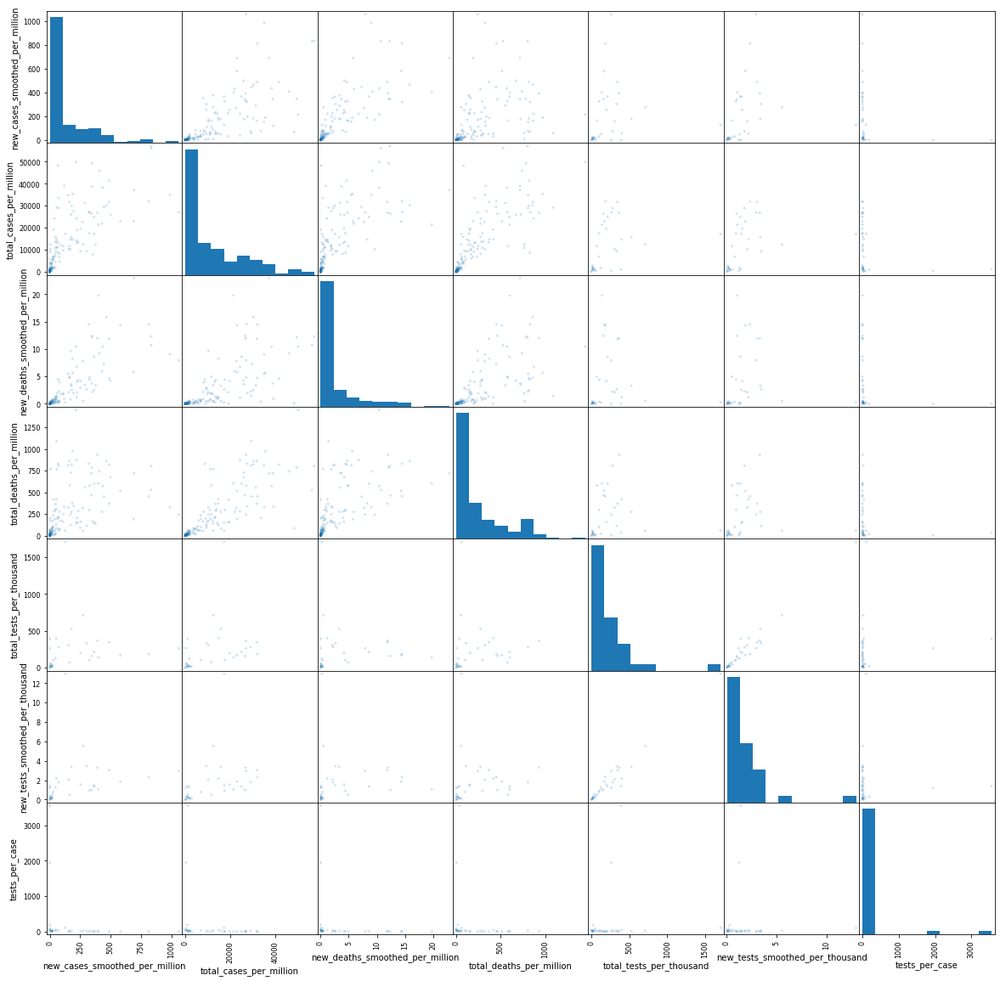

In [27]:
pd.plotting.scatter_matrix(todays_data.iloc[:,2:], figsize = (20,20), alpha=.2)
plt.show()

In [28]:
todays_data.iloc[:,2:].shape

(167, 9)

In [29]:
import ipywidgets as widgets
import datetime
dates = [datetime.date(2020, 1, 7) + 
         datetime.timedelta(days=k) for k in range(1000)]
dates = [date for date in dates if date < datetime.date.today()]
datewidget = widgets.SelectionSlider(options=[(i, i) for i in dates],
                                     value=datetime.date(2020, 1, 7),
                                     disabled=False,
                                     layout=widgets.Layout(width="75%"))

In [30]:
# Lastly, we use the `interact` function to create an output area which incorporates both the 
# slider and the resulting graph:
import mapclassify as mc
import matplotlib as mpl

female = 'F'
male = 'M'
clr = {'F':'PuRd', 'M':'Blues'}
norm = mpl.colors.Normalize(vmin=0, vmax=1000)


from ipywidgets import interact

def make_map(date,gender):
    date_str = datetime.datetime.strftime(date, "%m-%d-%y")
    if gender == 'F':
        cmap = 'PuRd'
    else:
        cmap = 'Blues'
        
    return gplt.choropleth(
        covid_world.query(f"date == '{date_str}' & leader_gender == @gender"),
        hue='total_deaths_per_million',
        cmap = cmap,
        norm=norm,
        legend=True,
        figsize=(20, 8)
    )

interact(make_map, date=datewidget, gender=female)

interactive(children=(SelectionSlider(description='date', layout=Layout(width='75%'), options=((datetime.date(…

<function __main__.make_map(date, gender)>

In [31]:
interact(make_map, date=datewidget, gender=male)

interactive(children=(SelectionSlider(description='date', layout=Layout(width='75%'), options=((datetime.date(…

<function __main__.make_map(date, gender)>